<h1 style="text-align: center;"><span style="color: #333399;">MIS665 Final Data Analysis Project: IMDB Movie Dataset</span></h1>
<h6 style="text-align: center;">Created by: Michael Gagliano on 10/4/2018</h6>
<h6 style="text-align: center;">"K-State Honor Code "On my honor, as a student, I have neither given nor received unauthorized aid on this academic work.</h6>

In [1]:
import pandas as pd
import numpy as np
import csv
import matplotlib.pyplot as plt
import seaborn as sns

## -- The data being used comes from: https://data.world/popculture/imdb-5000-movie-dataset

In [2]:
#regression packages
import sklearn.linear_model as lm
from sklearn.metrics import mean_squared_error
from sklearn.metrics import explained_variance_score

#Model selection/Train/Test Split
from sklearn.model_selection import StratifiedKFold, cross_val_score, train_test_split, GridSearchCV 


#f_regression (feature selection)
from sklearn.feature_selection import f_regression
from sklearn.feature_selection import SelectKBest

# recursive feature selection (feature selection)
from sklearn.feature_selection import RFE

import statsmodels.api as sm
from statsmodels.formula.api import ols

In [3]:
import plotly # An extremely powerful package that provides interactive data visualizations and graphs to be created
import cufflinks as cf # Allows for offline use as to bypass need for API credentials/bandwidth limitations
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

print(__version__) # requires version >= 1.9.0

import plotly.graph_objs as go
# For Notebooks
init_notebook_mode(connected=True)
# For offline use
cf.go_offline()

3.3.0


# 1. Preface - Business Understanding

The ability to process, understand, and transform data into a succinct and easy-to-understand story is an absolute neccessary skill for anyone involved in research. Effectively condensing these abstract and complex representations pave the way for data-driven innovations and solutions. In this project, I will be using a dataset that has been prepared by Chuan Sun (https://data.world/popculture/imdb-5000-movie-dataset) containing 28 variables for over 5000 movies over the last 100 years. With this data, I hope to: <b>

- (1) Demonstrate basic-yet-efficient data visualization techniques using primarily the Pandas/Seaborn/Matplotlib/Plotly libraries
- (2) Determine what variables found in the data potentially predict the anticipated success of a movie (IMDB Score)
- (3) Perform adequate statistical analysis to prove/refute the suggested hypothesis
- (4) Create regression and classification models based on the "best" features

</b>

Predicting what drives the success of a movie can be difficult. Economic factors, marketing, personal instinct/appeal, and movie critics all have the potential to sway the direction of the movie one way or another on the scale. Because all of these factors are often unreliable or inconsistent in their magnitude of effect, I hope to determine a more concrete, quantitative analysis to predict what drives the success of a movie.
<br>
<br>
<b>It is important to note that as with most datasets compiled from multiple sources, there are multiple imperfections. I will do my best to acknowledge any manipulation to the dataset may increase the magnitude of selection bias (non-organic, non-random sampling) when testing the hypothesis.</b>

# 2. Data Understanding

Let's preview our data below:

In [4]:
df = pd.read_csv('moviedata.csv')
df.head(10)

,color,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,...,num_user_for_reviews,language,country,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
0,Color,James Cameron,723.0,178.0,0.0,855.0,Joel David Moore,1000.0,760505847.0,Action|Adventure|Fantasy|Sci-Fi,...,3054.0,English,USA,PG-13,237000000.0,2009.0,936.0,7.9,1.78,33000
1,Color,Gore Verbinski,302.0,169.0,563.0,1000.0,Orlando Bloom,40000.0,309404152.0,Action|Adventure|Fantasy,...,1238.0,English,USA,PG-13,300000000.0,2007.0,5000.0,7.1,2.35,0
2,Color,Sam Mendes,602.0,148.0,0.0,161.0,Rory Kinnear,11000.0,200074175.0,Action|Adventure|Thriller,...,994.0,English,UK,PG-13,245000000.0,2015.0,393.0,6.8,2.35,85000
3,Color,Christopher Nolan,813.0,164.0,22000.0,23000.0,Christian Bale,27000.0,448130642.0,Action|Thriller,...,2701.0,English,USA,PG-13,250000000.0,2012.0,23000.0,8.5,2.35,164000
4,NaN,Doug Walker,NaN,NaN,131.0,NaN,Rob Walker,131.0,NaN,Documentary,...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,7.1,NaN,0
5,Color,Andrew Stanton,462.0,132.0,475.0,530.0,Samantha Morton,640.0,73058679.0,Action|Adventure|Sci-Fi,...,738.0,English,USA,PG-13,263700000.0,2012.0,632.0,6.6,2.35,24000
6,Color,Sam Raimi,392.0,156.0,0.0,4000.0,James Franco,24000.0,336530303.0,Action|Adventure|Romance,...,1902.0,English,USA,PG-13,258000000.0,2007.0,11000.0,6.2,2.35,0
7,Color,Nathan Greno,324.0,100.0,15.0,284.0,Donna Murphy,799.0,200807262.0,Adventure|Animation|Comedy|Family|Fantasy|Musi...,...,387.0,English,USA,PG,260000000.0,2010.0,553.0,7.8,1.85,29000
8,Color,Joss Whedon,635.0,141.0,0.0,19000.0,Robert Downey Jr.,26000.0,458991599.0,Action|Adventure|Sci-Fi,...,1117.0,English,USA,PG-13,250000000.0,2015.0,21000.0,7.5,2.35,118000
9,Color,David Yates,375.0,153.0,282.0,10000.0,Daniel Radcliffe,25000.0,301956980.0,Adventure|Family|Fantasy|Mystery,...,973.0,English,UK,PG,250000000.0,2009.0,11000.0,7.5,2.35,10000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5043 entries, 0 to 5042
Data columns (total 28 columns):
color                        5024 non-null object
director_name                4939 non-null object
num_critic_for_reviews       4993 non-null float64
duration                     5028 non-null float64
director_facebook_likes      4939 non-null float64
actor_3_facebook_likes       5020 non-null float64
actor_2_name                 5030 non-null object
actor_1_facebook_likes       5036 non-null float64
gross                        4159 non-null float64
genres                       5043 non-null object
actor_1_name                 5036 non-null object
movie_title                  5043 non-null object
num_voted_users              5043 non-null int64
cast_total_facebook_likes    5043 non-null int64
actor_3_name                 5020 non-null object
facenumber_in_poster         5030 non-null float64
plot_keywords                4890 non-null object
movie_imdb_link              5043 non-

In [6]:
# Quick descriptive statistics
df.describe()

,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_1_facebook_likes,gross,num_voted_users,cast_total_facebook_likes,facenumber_in_poster,num_user_for_reviews,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
count,4993.000000,5028.000000,4939.000000,5020.000000,5036.000000,4.159000e+03,5.043000e+03,5043.000000,5030.000000,5022.000000,4.551000e+03,4935.000000,5030.000000,5043.000000,4714.000000,5043.000000
mean,140.194272,107.201074,686.509212,645.009761,6560.047061,4.846841e+07,8.366816e+04,9699.063851,1.371173,272.770808,3.975262e+07,2002.470517,1651.754473,6.442138,2.220403,7525.964505
std,121.601675,25.197441,2813.328607,1665.041728,15020.759120,6.845299e+07,1.384853e+05,18163.799124,2.013576,377.982886,2.061149e+08,12.474599,4042.438863,1.125116,1.385113,19320.445110
min,1.000000,7.000000,0.000000,0.000000,0.000000,1.620000e+02,5.000000e+00,0.000000,0.000000,1.000000,2.180000e+02,1916.000000,0.000000,1.600000,1.180000,0.000000
25%,50.000000,93.000000,7.000000,133.000000,614.000000,5.340988e+06,8.593500e+03,1411.000000,0.000000,65.000000,6.000000e+06,1999.000000,281.000000,5.800000,1.850000,0.000000
50%,110.000000,103.000000,49.000000,371.500000,988.000000,2.551750e+07,3.435900e+04,3090.000000,1.000000,156.000000,2.000000e+07,2005.000000,595.000000,6.600000,2.350000,166.000000
75%,195.000000,118.000000,194.500000,636.000000,11000.000000,6.230944e+07,9.630900e+04,13756.500000,2.000000,326.000000,4.500000e+07,2011.000000,918.000000,7.200000,2.350000,3000.000000
max,813.000000,511.000000,23000.000000,23000.000000,640000.000000,7.605058e+08,1.689764e+06,656730.000000,43.000000,5060.000000,1.221550e+10,2016.000000,137000.000000,9.500000,16.000000,349000.000000


In [7]:
df.median()

num_critic_for_reviews            110.00
duration                          103.00
director_facebook_likes            49.00
actor_3_facebook_likes            371.50
actor_1_facebook_likes            988.00
gross                        25517500.00
num_voted_users                 34359.00
cast_total_facebook_likes        3090.00
facenumber_in_poster                1.00
num_user_for_reviews              156.00
budget                       20000000.00
title_year                       2005.00
actor_2_facebook_likes            595.00
imdb_score                          6.60
aspect_ratio                        2.35
movie_facebook_likes              166.00
dtype: float64

### i. Data Integrity Surface-Level Evaluation

Already we can see there is a number of missing/NaN values across both categorical and numerical dtype columns. 
<br>
<br>
<b>Numerical Data Resolution: </b>
For the numeric data, the easiest way to resolve this is using the idea <b> "The Law of Large Numbers"</b> - simply stated as the sample size increases, the mean of that sample population becomes more accurate. So we will calculate the mean and median values of the numeric columns and replace them with the central value.
<br>
<br>
<b>Categorical Data Resolution:</b>
For the categorical data, the immediate "best" solution is to map them to dummy variables. However this does not solve the issue of missing values in columns like Country, Language, and Content Rating when specific values are necessary for accuracy and applying a mean/median value here would not be appropriate. For example, there is no such thing as a "rating and a half" or "PG 1/2". Variables with large degrees of freedom such as Plot_Keywords make dummy_variables cumbersome and difficult to interpret, as well. Accounting for duplicate movies will also be necessary. <i>A method to fix this will be discussed at the end of the analysis. For now, we will ignore it as much as we can due to time constraints.</i>
<br>
<br> 
<b>Overall Data Quality Resolution:</b>
The dataset is not necessarily "current" from when the original code was compiled and ran for collection. The frequency and volume of "Facebook Likes" over time surely will have changed, as well as deviances in overall critic ratings/IMDB scores. This is not to say the data is bad, but <b>the analysis must then therefore be treated as  "snapshot" in time for these movies</b> and with the aformentioned issues stated above, a more targeted and refined scraping script may yield more current and complete data than Chuan Sun's.

<b><h3><span style="color: red;">Accounting for Categorical Data Discrepancies: </span></b></h3>
<br>
<br>
Doing some exploratory analysis, it was noticed that the aggregate data contains both movies AND TV Shows. The issue stems from Sun's method of scraping the data from his method to pull IMDb URL's. The original source - www.the-numbers.com - was how he scraped the list of movies to be utilized for this dataset. However, the website did not effectively separate movies and TV shows, nor did his code catch it as a result. Therefore when he executed his code to scrape fields on IMDb's website, TV-specific URL's that were scraped and then later parsed would not contain the correct information due to the different fields compared to the Movie URLs. 
<br>
<br>
A prime example of this is the Director field compared to the Movie Title. <b>The code still populates the Movie Title field with the identical "div class='title_wrapper'" <i>Xpath</i> code and other same-location fields.</b> However, TV Shows do not contain 'Director' fields, they contain 'Producer' fields. That is why some of the more movie-specific fields (director, gross, budget, etc.) are None/NaN.

- Director Name will appear as NaN if the row is a TV Show/TV Documentary. Delete all rows that have a movie title, but Director_name == NaN.
- Gross will appear as NaN if the movie was not shown in US theaters. The Gross value is from USA Gross, not Worldwide. Delete all rows that Gross == NaN to account for only Domestic USA data
- Budget will appear as NaN if TV Show, TV Documentary, or simply just not reported on IMDb. This is difficult to account for and removing all rows will be difficult without skewing the data too far
<br>
<br>
Source: https://github.com/sundeepblue/movie_rating_prediction/blob/master/movie/spiders/movie_budget_spider.py

Examples
``` Python 

df.iloc[5039] #TV Show, many values not pulled in
df.iloc[5] # Gross Reported as it is a USA Film, therefore showing USA Gross value. 
df.iloc[4] # NaN values for everything, TV documentary with minimal info
df.iloc[5014] # Budget not reported, everything else is

```

In [8]:
df.iloc[5039]

color                                                                    Color
director_name                                                              NaN
num_critic_for_reviews                                                      43
duration                                                                    43
director_facebook_likes                                                    NaN
actor_3_facebook_likes                                                     319
actor_2_name                                                     Valorie Curry
actor_1_facebook_likes                                                     841
gross                                                                      NaN
genres                                            Crime|Drama|Mystery|Thriller
actor_1_name                                                       Natalie Zea
movie_title                                         The Following             
num_voted_users                                     

# 3. Data Pre-Processing and Initial Visualizations

In [9]:
#Deleting rows where value == NaN under the variables identified above.
pd.set_option('mode.chained_assignment', None)

df2 = df.dropna(subset=['director_name', 'gross', 'actor_1_name'])
df2 = df2.reset_index(drop=True) #resetting index and preventing the old index from being added as a column
df2.to_csv('moviedata_clean.csv')

The data has now been cleaned to represent strictly movies that also have a reported USA Domestic Gross value reported. Deleting all Gross NaN values is an aggressive approach but for the purpose of this project it will have to suffice, as opposed to scraping a secondary database for that information. This will allow for much more concise visualizations without having to work around NaN variables that may skew or illustrate an incorrect representation.

In [10]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4152 entries, 0 to 4151
Data columns (total 28 columns):
color                        4150 non-null object
director_name                4152 non-null object
num_critic_for_reviews       4149 non-null float64
duration                     4150 non-null float64
director_facebook_likes      4152 non-null float64
actor_3_facebook_likes       4143 non-null float64
actor_2_name                 4150 non-null object
actor_1_facebook_likes       4152 non-null float64
gross                        4152 non-null float64
genres                       4152 non-null object
actor_1_name                 4152 non-null object
movie_title                  4152 non-null object
num_voted_users              4152 non-null int64
cast_total_facebook_likes    4152 non-null int64
actor_3_name                 4143 non-null object
facenumber_in_poster         4145 non-null float64
plot_keywords                4112 non-null object
movie_imdb_link              4152 non-

A LOT more consistent variance between value_counts now

In [11]:
df2.describe()

,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_1_facebook_likes,gross,num_voted_users,cast_total_facebook_likes,facenumber_in_poster,num_user_for_reviews,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
count,4149.000000,4150.000000,4152.000000,4143.000000,4152.000000,4.152000e+03,4.152000e+03,4152.000000,4145.000000,4151.000000,3.888000e+03,4152.000000,4150.000000,4152.000000,4049.000000,4152.000000
mean,159.537479,109.520482,747.854528,724.280714,7349.166667,4.854980e+07,9.764207e+04,10900.115366,1.375875,313.322332,4.524463e+07,2003.264692,1889.402651,6.468088,2.106318,8744.007948
std,122.569060,22.406001,2947.683506,1811.375566,15054.787437,6.848194e+07,1.473355e+05,18527.636531,2.041816,399.619657,2.224718e+08,9.948725,4371.778226,1.050645,0.349260,20803.100152
min,1.000000,34.000000,0.000000,0.000000,0.000000,1.620000e+02,5.000000e+00,0.000000,0.000000,1.000000,2.180000e+02,1920.000000,0.000000,1.600000,1.180000,0.000000
25%,70.000000,95.000000,10.000000,173.000000,699.000000,5.377819e+06,1.525800e+04,1748.750000,0.000000,93.000000,1.000000e+07,1999.000000,344.000000,5.900000,1.850000,0.000000
50%,130.000000,105.000000,57.000000,416.000000,1000.000000,2.556371e+07,4.648100e+04,3707.000000,1.000000,191.000000,2.400000e+07,2005.000000,650.000000,6.600000,2.350000,183.500000
75%,217.000000,119.000000,218.000000,676.000000,12000.000000,6.234110e+07,1.147095e+05,15575.750000,2.000000,374.000000,5.000000e+07,2010.000000,962.000000,7.200000,2.350000,10000.000000
max,813.000000,330.000000,23000.000000,23000.000000,640000.000000,7.605058e+08,1.689764e+06,656730.000000,43.000000,5060.000000,1.221550e+10,2016.000000,137000.000000,9.300000,16.000000,349000.000000


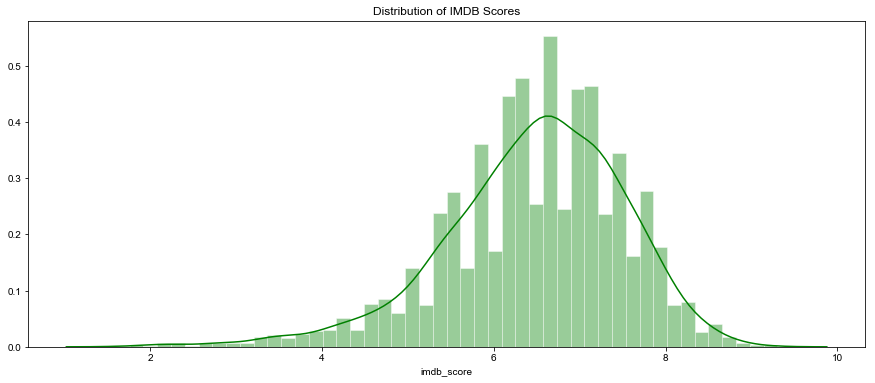

In [12]:
# Distribution of IMDB Scores
plt.figure(figsize=(15,6))
plt.title('Distribution of IMDB Scores')
sns.set_style('whitegrid')
sns.distplot(df2['imdb_score'],color='green');

<b>Heatmap for all Variables</b>

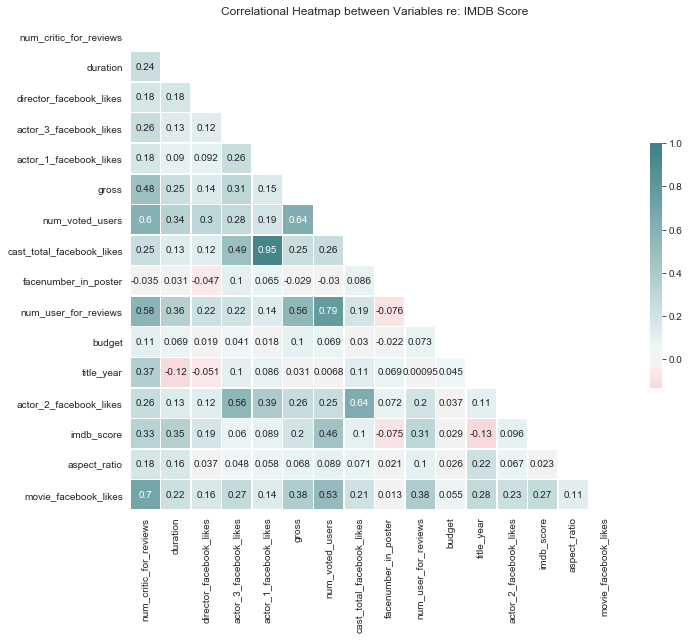

In [13]:
# Compute the correlation matrix
corr = df2.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(10, 200, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, annot=True, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5});

ax.set_title('Correlational Heatmap between Variables re: IMDB Score')
plt.show()

In [14]:
# Importing all necessary Plot.ly packages
import plotly # An extremely powerful package that provides interactive data visualizations and graphs to be created
import cufflinks as cf # Allows for offline use as to bypass need for API credentials/bandwidth limitations
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

print(__version__) # requires version >= 1.9.0

import plotly.graph_objs as go
# For Notebooks
init_notebook_mode(connected=True)
# For offline use
cf.go_offline()

3.3.0


In [15]:



ax_x = df2['title_year']
ax_y1 = df2['imdb_score']

# Create traces
trace0 = go.Scatter(
    x = ax_x,
    y = ax_y1,
    mode = 'markers',
    name = 'markers',
    text = df2['movie_title']
)

layout= go.Layout(
    title= 'IMDb score by Production Year',
    hovermode= 'closest',
    xaxis= dict(
        title= 'Year',
        ticklen= 5,
        zeroline= False,
        gridwidth= 2,
    ),
    yaxis=dict(
        title= 'IMDb Score',
        ticklen= 5,
        gridwidth= 2,
    ),
    showlegend= False
)
fig= go.Figure(data=[trace0], layout=layout)
iplot(fig)

# 4. Business Intelligence: Exploratory Analysis of Variables <i>hypothetized to impact IMDb Score</i>

## i. Director Volume of Production vs. Mean IMDb Score

#### - Will not be used in Classification Model - 

In [16]:
# Getting our 'baseline' for reference - Average IMDb score and Average Volume of Production by Director

#Calculating average number of movies per director
d_size = df2['director_name'].unique().size
print('Out of 4156 movies, there are %d unique director values.' % (d_size-1)) #Accounting for index starting at 0
print('That works out to be %.02f movies per director.' % (4152/(d_size-1)) )

#Calculating avg. meanimdb_score
score_avg = df2['imdb_score'].mean()
print('The mean IMDb score in the cleaned dataset is %.02f' % score_avg)

Out of 4156 movies, there are 1873 unique director values.
That works out to be 2.22 movies per director.
The mean IMDb score in the cleaned dataset is 6.47


In [17]:
# Top 10 Directors based on movies produced
# Achieved by method-chaining value_counts() and .head()

director_count = df2['director_name'].value_counts()
director_count = pd.DataFrame(director_count)
director_count.head(10)

,director_name
Steven Spielberg,25
Woody Allen,19
Clint Eastwood,19
Martin Scorsese,18
Ridley Scott,17
Tim Burton,16
Steven Soderbergh,16
Spike Lee,15
Renny Harlin,15
Barry Levinson,13


In [18]:
# Top 10 Directors based on MEAN IMDb Score of their directed movies

d_score = df2.groupby('director_name').imdb_score.mean().sort_values(ascending = False)
d_score = pd.DataFrame(d_score)
d_score.head(10)

,imdb_score
director_name,
Charles Chaplin,8.600000
Ron Fricke,8.500000
Damien Chazelle,8.500000
Alfred Hitchcock,8.500000
Majid Majidi,8.500000
Tony Kaye,8.450000
Sergio Leone,8.433333
Christopher Nolan,8.425000
Rakeysh Omprakash Mehra,8.400000


In [19]:
# Merging and sorting the highest average (by Median) rated IMDb Score films with their respective directors.
# Specific to this variable, this controls for duplicate directors in the data. 


director_imdb = director_count.merge(d_score, left_index=True, right_index=True).sort_values(by='imdb_score', ascending = False)
d_i = director_imdb

d_i.to_csv('director_imdb.csv') #Saving to csv file 
d_i.head(10)

,director_name,imdb_score
Charles Chaplin,1,8.600000
Damien Chazelle,1,8.500000
Majid Majidi,1,8.500000
Alfred Hitchcock,1,8.500000
Ron Fricke,1,8.500000
Tony Kaye,2,8.450000
Sergio Leone,3,8.433333
Christopher Nolan,8,8.425000
Rakeysh Omprakash Mehra,1,8.400000
Marius A. Markevicius,1,8.400000


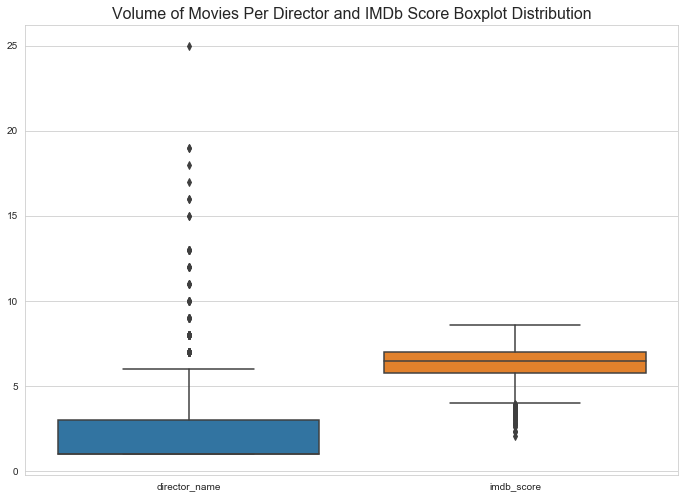

In [20]:
#Plot
fig, ax = plt.subplots()
ax.set_title('Volume of Movies Per Director and IMDb Score Boxplot Distribution', fontsize=16)
#Size
fig.set_size_inches(11.7, 8.27)
sns.boxplot(data=d_i, ax=ax);

In [21]:
d_i.describe()

,director_name,imdb_score
count,1874.000000,1874.000000
mean,2.215582,6.326897
std,2.246776,1.017708
min,1.000000,2.100000
25%,1.000000,5.800000
50%,1.000000,6.493750
75%,3.000000,7.000000
max,25.000000,8.600000


In [22]:
import scipy.stats as stats

# Population mean (df['imdb_score]') = 6.47
# Sample mean (df['imdb_score]') = 6.33
# H0 (null) = Directors have no influence on the mean IMDb score
# Ha (alternative) = Directors have an influence on the mean IMDb score

stats.ttest_ind(d_i['imdb_score'], df2['imdb_score'], equal_var = False)

Ttest_indResult(statistic=-4.934983025351897, pvalue=8.36713122624256e-07)

###  Director Name Summary:

When grouping directors by the volume of films produced relative to their average IMDb scores, a few interesting things appeared:

- The average number of movies per director in this dataset is 2.10 (population) and 2.21 (sample). Initially, you may figure this is a low amount for your hollywood directors until you see that 75% of directors have produced 3 or less movies. 

- Using two-tailed t-testing, I compared the mean IMDb scores for the population dataset to the grouped data of directors. The p-value (8.36e-07) was far below the standard 0.05 limit.

- We can therefore REJECT the Null Hypothesis and ACCEPT the Alternative Hypothesis; <b>Director does have a significant influence on the average IMDb Score</b>

## ii. Duration vs. Mean IMDb Score

In [23]:
# Getting our 'baseline' for reference - Average IMDb score and Average Volume of Production by Director

#Calculating average number of movies per director
dur_avg = df2['duration'].mean()
print('The mean duration in the cleaned dataset is %.02f minutes long' % dur_avg)
#Calculating avg. mean imdb_score
score_avg = df2['imdb_score'].mean()
print('The mean IMDb score in this cleaned dataset is %.02f' % score_avg)

The mean duration in the cleaned dataset is 109.52 minutes long
The mean IMDb score in this cleaned dataset is 6.47


In [24]:
#Replacing missing NaN values with Central Value

df2['duration'] = df2['duration'].fillna(dur_avg)

Because there is large variance between <i>exact</i> movie times, I am going to "chunk" the data into 5 nearly-equal groupings. From there I can run statistical analysis to on each sub-group, and determine if there is any statisitical significance between the groups and their respective average IMDb Scores

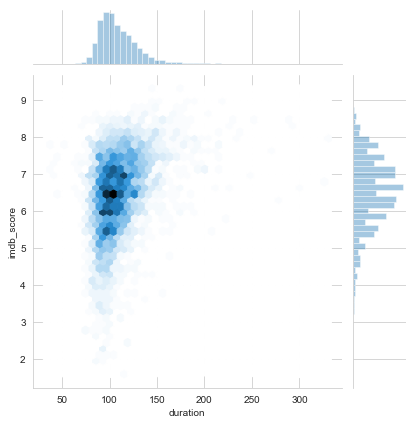

In [25]:
sns.jointplot(x='duration', y='imdb_score', data=df2, kind='hex', gridsize=40)

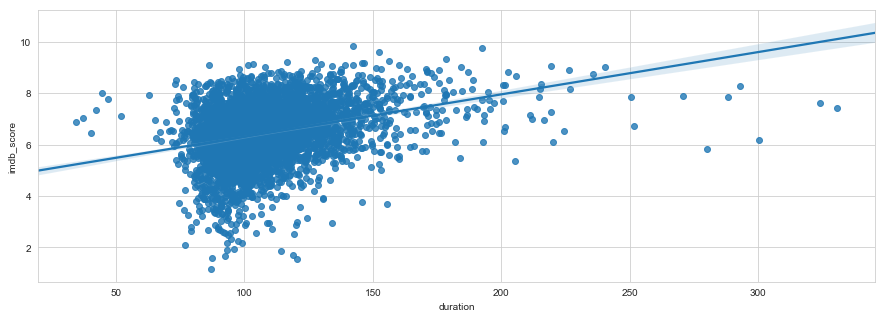

In [26]:
plt.figure(figsize=(15,5))
sns.regplot(x='duration',y='imdb_score',data=df2, x_jitter=.9, y_jitter=.9)

Normalized Distribution of movies re: Duration v. IMDb Score

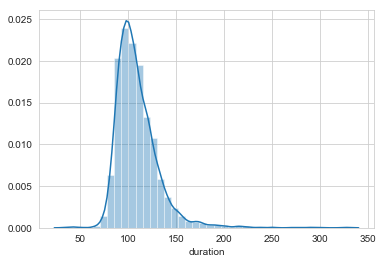

In [27]:
sns.distplot(df2['duration'], bins= 40)

In [28]:
#Creating bins via the 'duration' Columns to discretize the data; i.e. partition the data equally into groups

#Minutes
df2['dur_group'] = pd.qcut(df2['duration'], 5)
df2['dur_group_num'] = pd.qcut(df2['duration'], 5, labels=['1', '2', '3', '4', '5'])

#Hours
df2['hours'] = df2['duration'] / 60
df2['hours_group'] = pd.qcut(df2['hours'], 5)

In [29]:
print(df2['dur_group'].value_counts())
print(df2['dur_group_num'].value_counts())

(33.999, 93.0]    876
(93.0, 101.0]     857
(101.0, 110.0]    821
(123.0, 330.0]    801
(110.0, 123.0]    797
Name: dur_group, dtype: int64
1    876
2    857
3    821
5    801
4    797
Name: dur_group_num, dtype: int64


In [30]:
dur_score = df2[['imdb_score','dur_group_num']]
dur_score[9:15] #random slice to show grouping

,imdb_score,dur_group_num
9,6.9,5
10,6.1,5
11,6.7,3
12,7.3,5
13,6.5,5
14,7.2,5


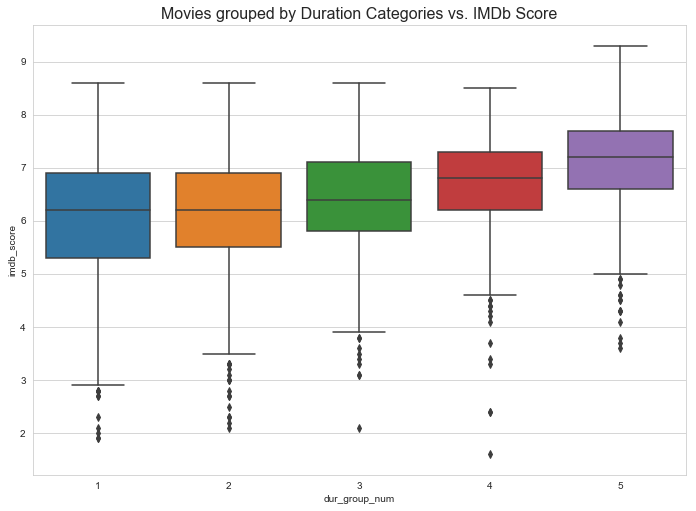

In [31]:
#Plot
fig, ax = plt.subplots()
ax.set_title('Movies grouped by Duration Categories vs. IMDb Score', fontsize=16)
#Size
fig.set_size_inches(11.7, 8.27)
sns.boxplot(x = 'dur_group_num', y = 'imdb_score', data=dur_score, ax=ax);

In [32]:
#Overlayed Histogram of Duration Groups v. IMDB rating, grouped by bins

# Add histogram data
g1 = df2.loc[df2['dur_group_num'] == '1']  
g2 = df2.loc[df2['dur_group_num'] == '2'] 
g3 = df2.loc[df2['dur_group_num'] == '3']
g4 = df2.loc[df2['dur_group_num'] == '4']
g5 = df2.loc[df2['dur_group_num'] == '5']

# select fare column from yes group
x1 = g1.imdb_score
x2 = g2.imdb_score
x3 = g3.imdb_score
x4 = g4.imdb_score
x5 = g5.imdb_score

# Creating Histograms for each group
g1 = go.Histogram(
    x=x1,
    opacity=0.75,
    name='Group 1'
)

g2 = go.Histogram(
    x=x2,
    opacity=0.75,
    name='Group 2'
)

g3 = go.Histogram(
    x=x3,
    opacity=0.75,
    name='Group 3'
)

g4 = go.Histogram(
    x=x4,
    opacity=0.75,
    name='Group 4'
)

g5 = go.Histogram(
    x=x5,
    opacity=0.75,
    name='Group 5'
)


data = [g1, g2, g3, g4, g5]
layout = go.Layout(barmode='overlay')
fig = go.Figure(data=data, layout=layout)

iplot(fig)

In [33]:
dur_score.groupby('dur_group_num').mean()

,imdb_score
dur_group_num,
1,6.025799
2,6.155893
3,6.407065
4,6.711920
5,7.105743


In [34]:
# test any significant differences in tip amounts for the grouped durations
# Anova test (Assumes h0: u1 = u2 = u3 = u4; They are all equal and no difference)

g1 = df2[df2['dur_group_num'] == '1']['imdb_score']
g2 = df2[df2['dur_group_num'] == '2']['imdb_score']
g3 = df2[df2['dur_group_num'] == '3']['imdb_score']
g4 = df2[df2['dur_group_num'] == '4']['imdb_score']
g5 = df2[df2['dur_group_num'] == '5']['imdb_score']

f_val, p_val = stats.f_oneway(g1, g2, g3, g4, g5)
  
print("One-way ANOVA P =", p_val, "F value", f_val )

One-way ANOVA P = 1.0704275394792952e-131 F value 165.57822104682802


In [35]:
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from statsmodels.stats.multicomp import MultiComparison

mc = MultiComparison(df2['imdb_score'], df2['dur_group_num'])
result = mc.tukeyhsd()
 
print(result)
print(mc.groupsunique)

Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff lower  upper  reject
-------------------------------------------
  1      2     0.1301  0.0021 0.2581  True 
  1      3     0.3813  0.2519 0.5107  True 
  1      4     0.6861  0.5557 0.8165  True 
  1      5     1.0799  0.9497 1.2102  True 
  2      3     0.2512  0.1211 0.3813  True 
  2      4     0.556   0.4249 0.6871  True 
  2      5     0.9499  0.8189 1.0808  True 
  3      4     0.3049  0.1724 0.4373  True 
  3      5     0.6987  0.5664 0.831   True 
  4      5     0.3938  0.2606 0.5271  True 
-------------------------------------------
['1' '2' '3' '4' '5']


###  Duration Summary:

When analyzing the relationship between duration of a movie and IMDb Score I was able to find:

- Their is a 0.35 correlation coefficient - a weak, almost-moderate strength relationship - between duration and IMDb Score, meaning that if the longer the movie is, it is statistically somewhat more likely it will receive a higher average IMDb Score.

- Using single-variable ANOVA, I found a p-value immensely below the 0.05 threshold (2.58e-131). This refutes the null hypothesis and can confirm that there a difference in IMDb score based on movie duration.

- Using the 'turkey test' post hoc testing method I was able to confirm that all groups, when compared against one another, are statistically different than one another. This ensures that we can reject the null hypothesis between duration groups and IMDb scores as well. Consider it 'added insurance' that we are confident in the assessment.

## iii. Facebook Likes per Movie vs. Mean IMDb Score

With one of the highest positive correlations (0.7), and *technically* no missing values, this will be a very important variable to assess. Because of the high amount of variance in the volume of likes, I will assess this variable similar to 'Duration' above.

In [36]:
#Value Counts grouped by the amount of movies that share the same aggregate like values
df2['movie_facebook_likes'].value_counts().head(10)

0        1890
1000       91
11000      77
10000      70
12000      57
13000      54
15000      51
14000      47
16000      44
2000       43
Name: movie_facebook_likes, dtype: int64

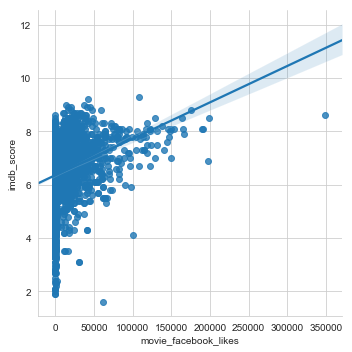

In [37]:
#Visualize
sns.lmplot(x='movie_facebook_likes', y='imdb_score', data=df2)

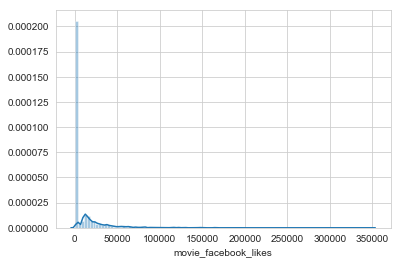

In [38]:
#KDE plot will be goofy due to the 0 values
sns.distplot(df2['movie_facebook_likes'], bins= 100)

In [39]:
#Creating bins via the 'Movie_Facebook_Likes' Columns to discretize the data; i.e. partition the data equally into groups

df2['movie_fb_group'] = pd.qcut(df2['movie_facebook_likes'], 4, duplicates='drop', labels=['1', '2', '3'])
df2['movie_fb_group'].value_counts()

1    2076
2    1050
3    1026
Name: movie_fb_group, dtype: int64

In [40]:
fbmovie_score = df2[['imdb_score','movie_fb_group']]
fbmovie_score[9:15] #random slice to show grouping

,imdb_score,movie_fb_group
9,6.9,3
10,6.1,1
11,6.7,1
12,7.3,2
13,6.5,3
14,7.2,3


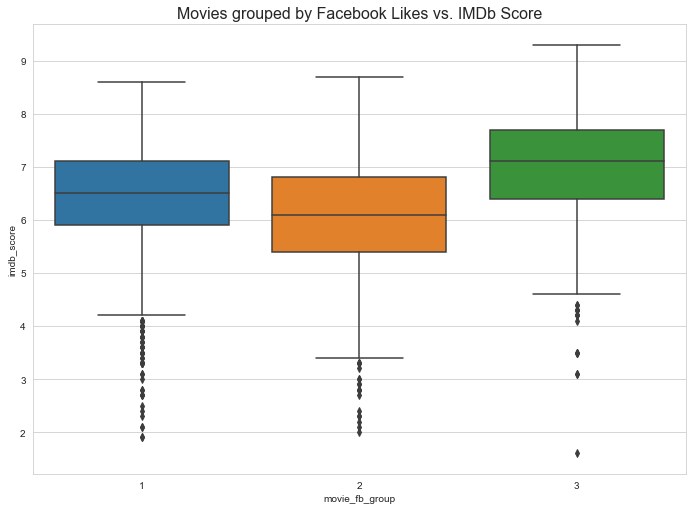

In [41]:
#Plot
fig, ax = plt.subplots()
ax.set_title('Movies grouped by Facebook Likes vs. IMDb Score', fontsize=16)
#Size
fig.set_size_inches(11.7, 8.27)
sns.boxplot(x = 'movie_fb_group', y = 'imdb_score', data=fbmovie_score, ax=ax);

<b><h3><span style="color: red;">Note prior to Statistical Analysis: </span></b></h3>
While not modifying or deleting the 0-values as explained earlier, they will greatly influence the means of each sample group. As such, I have performed the analysis as if the data was accurate and complete although it is definitely not. The following calculations should only serve to illustrate how statistical analysis would be performed, but not to validate these findings here.

In [42]:
fbmovie_score.groupby('movie_fb_group').mean()

,imdb_score
movie_fb_group,
1,6.419605
2,6.026952
3,7.017641


In [43]:
# test any significant differences in tip amounts for the grouped durations
# Anova test (Assumes h0: u1 = u2 = u3; They are all equal and no difference)

g1 = df2[df2['movie_fb_group'] == '1']['imdb_score']
g2 = df2[df2['movie_fb_group'] == '2']['imdb_score']
g3 = df2[df2['movie_fb_group'] == '3']['imdb_score']

f_val, p_val = stats.f_oneway(g1, g2, g3)
  
print("One-way ANOVA P =", p_val, "F value", f_val )

One-way ANOVA P = 4.793303574789878e-109 F value 265.0273393905538


###  Facebook Movie Likes Summary:

Okay, so there are A LOT of zero-values (1,890). There are a few reasons I will not manipulate or change the data further regarding this variable:

- Facebook pages may have tons of duplicates, we are unable to confirm if they were gathered from the 'Official' page each time. This potentially dilutes the data in the sample.

- 'Likes' by definition are a polarizing, binary measurement. The lack of a 'like' does not inherently indicate 'dislike'. The action of 'liking' a page depends on page visibility, among a laundry list of other factors.

- Some movies may not have a Facebook page, some may not have been as easy to find at the time. If I remove 1,890 values from this dataset, the sample size changes drastically. You could test for normalcy before and after removing the 0-values, which could infer if there is/is not a significant difference between the groups - however I am choosing not to. 

- Again, we are treating this data as a snapshot in time, as 'likes' have changed over time.

- <b>This variable should not be used to accurately predict IMDb score unless calculated in real time with current and complete dataset values</b>

###  1st Actor of a Movie vs. IMDb Score:

In [44]:
# Getting our 'baseline' for reference - Average IMDb score and Average Volume of Production by Director

#Calculating average number of movies per director
a_size = df2['actor_1_name'].unique().size
print('Out of 4152 movies, there are %d unique 1st actor values.' % (a_size-1)) #Accounting for index starting at 0
print('That works out to be %.02f movies per 1st actor.' % (4152/(a_size-1)) )

#Calculating avg. meanimdb_score
score_avg = df2['imdb_score'].mean()
print('The mean IMDb score in the cleaned dataset is %.02f' % score_avg)

Out of 4152 movies, there are 1617 unique 1st actor values.
That works out to be 2.57 movies per 1st actor.
The mean IMDb score in the cleaned dataset is 6.47


In [45]:
# Top 5 Actors based on movies starred as 1st actor
# Achieved by method-chaining value_counts() and .head()

actor_count = df2['actor_1_name'].value_counts()
actor_count = pd.DataFrame(actor_count)
actor_count.head()

,actor_1_name
Robert De Niro,42
Johnny Depp,40
Nicolas Cage,31
J.K. Simmons,31
Matt Damon,30


In [46]:
# Top 5 Actors based on MEAN IMDb Score of their directed movies

a_score = df2.groupby('actor_1_name').imdb_score.mean().sort_values(ascending = False)
a_score = pd.DataFrame(a_score)
a_score.head()

,imdb_score
actor_1_name,
Takashi Shimura,8.7
Scatman Crothers,8.7
Paulette Goddard,8.6
Bunta Sugawara,8.6
Bahare Seddiqi,8.5


In [47]:
# Merging and sorting the highest average (by Median) rated IMDb Score films with their respective directors.
# Specific to this variable, this controls for duplicate directors in the data. 


actor1_imdb = actor_count.merge(a_score, left_index=True, right_index=True).sort_values(by='imdb_score', ascending = False)
a_i = actor1_imdb

a_i.to_csv('actor1_imdb.csv') #Saving to csv file 
a_i.head()

,actor_1_name,imdb_score
Takashi Shimura,1,8.7
Scatman Crothers,1,8.7
Bunta Sugawara,1,8.6
Paulette Goddard,1,8.6
Janet Leigh,1,8.5


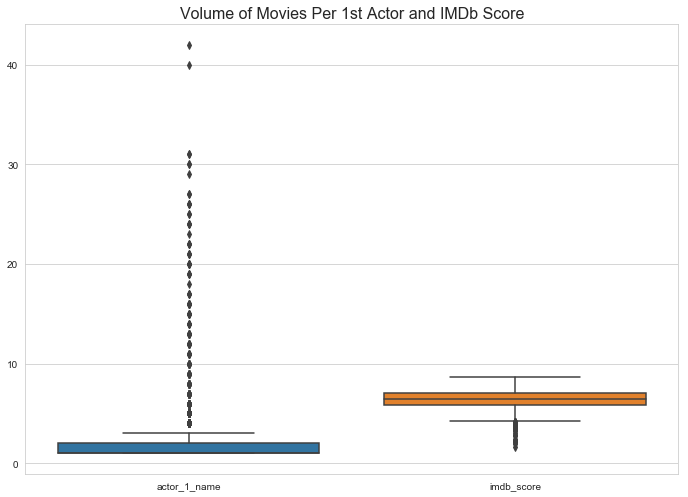

In [48]:
#Plot
fig, ax = plt.subplots()
ax.set_title('Volume of Movies Per 1st Actor and IMDb Score', fontsize=16)
#Size
fig.set_size_inches(11.7, 8.27)
sns.boxplot(data=a_i, ax=ax);

In [49]:
a_i.describe()

,actor_1_name,imdb_score
count,1618.000000,1618.000000
mean,2.566131,6.402700
std,4.045767,1.013481
min,1.000000,1.600000
25%,1.000000,5.900000
50%,1.000000,6.500000
75%,2.000000,7.100000
max,42.000000,8.700000


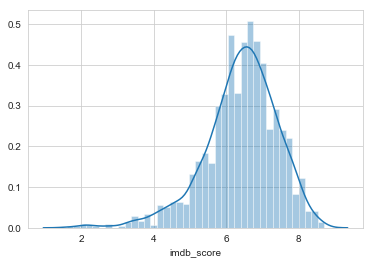

In [50]:
#Visualizing score distribution
sns.distplot(a_i['imdb_score'], bins= 40)

In [51]:
import scipy.stats as stats

# Population mean (df['imdb_score]') = 6.47
# Sample mean (df['imdb_score]') = 6.40
# H0 (null) = 1st Actor Names have no influence on the mean IMDb score
# Ha (alternative) = 1st Actor Names have an influence on the mean IMDb score

stats.ttest_ind(a_i['imdb_score'], df2['imdb_score'], equal_var = False)

Ttest_indResult(statistic=-2.1787783096803395, pvalue=0.029424527956778104)

###  1st Actor Name Summary:

When grouping 1st name actors by the volume of films produced relative to their average IMDb scores, a few interesting things appeared:

- The average number of movies per director in this dataset is 2.56 (population) and 2.57 (sample). Thats astonishingly close, which could make a good argument for normalized and accurate representation. That also means for "the big actors" like Alec Baldwin (42 movies) and Johnny Depp (40 Movies), they are actually considered outliers on this list.

- Using two-tailed t-testing, I compared the mean IMDb scores for the population dataset to the grouped data of 1st name actors. The p-value was <b>barely</b> below the standard 0.05 limit (0.029). This means that we can be confident that the 1st name actor likely does influence the potential success (IMDb Score) of a movie.


###  Number of Users for Reviews vs. IMDb Score:

In [52]:
#Replacing missing values by imputing average values
df2['num_user_for_reviews'].fillna(df2['num_user_for_reviews'].mean(), inplace=True)

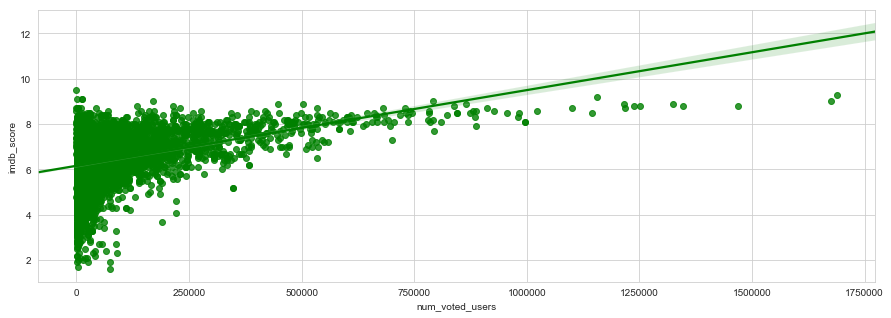

In [53]:
plt.figure(figsize=(15,5))
sns.regplot(y='imdb_score',x='num_voted_users',data=df, color='green')

# 5. Additional Business Intelligence Insights + Correlation Analysis

Because the original dataset was largely modified, it might be worth looking into a few other variables to potentially answer new questions, or develop new solutions to avoid more accurate and representative datasets.

### i. How has the rating of movies changed through the years? 

From the graph pictured below:
<br><br>
You may notice the trend that the older a movie was produced, the higher average rating it may recieve. I hypothesize that this is largely due to the majority sentiment of 'respected classic cinema' and the limited reporting of movies from a large chunk of the years collected outside of the more-recent decades.

In [54]:
ax_x = df2['title_year']
ax_y1 = df2['imdb_score']

# Create traces
trace0 = go.Scatter(
    x = ax_x,
    y = ax_y1,
    mode = 'markers',
    name = 'markers',
    text = df2['movie_title']
)

layout= go.Layout(
    title= 'IMDb score by Production Year',
    hovermode= 'closest',
    xaxis= dict(
        title= 'Year',
        ticklen= 5,
        zeroline= False,
        gridwidth= 2,
    ),
    yaxis=dict(
        title= 'IMDb Score',
        ticklen= 5,
        gridwidth= 2,
    ),
    showlegend= False
)
fig= go.Figure(data=[trace0], layout=layout)
iplot(fig)

### Breakdown of Movies by Country (via 'cleaned' dataset)

In [55]:
df2['country'].value_counts().head(10)

USA          3233
UK            364
France        120
Germany        88
Canada         71
Australia      42
Spain          26
India          23
China          19
Japan          17
Name: country, dtype: int64

In [56]:
labels = df2['country']
values = df2['country'].value_counts()

trace = go.Pie(labels=labels, values=values)

iplot([trace], filename='data/basic_pie_chart')

Visualization is almost overkill in this situation; The USA produced a whopping 96.1% of the movies analyzed in this dataset. This again may be due to the original dataset choosing 'USA Domestic Gross' instead of 'International Gross' to scrape on, and when the data was cleaned all rows containing NaN values in 'Gross' were removed. 

Testing for Normal Distribution of Countries; This helps us see if we can infer that this dataset is a good or bad representation of the population.

In [57]:
#Shapiro-Wilks Test:

print(stats.shapiro(df2['country'].value_counts()))

print('This sample data does not assume normality based on the distribution of countries.')

(0.17280429601669312, 5.78801499187976e-15)
This sample data does not assume normality based on the distribution of countries.


In [58]:
ax_x = df2['country']
ax_y1 = df2['imdb_score']

# Create traces
trace0 = go.Scatter(
    x = ax_x,
    y = ax_y1,
    mode = 'markers',
    name = 'markers',
    text = df2['movie_title']
)

layout= go.Layout(
    title= 'Movie IMDb Score aggregated by Country of Production',
    hovermode= 'closest',
    xaxis= dict(
        title= 'Country of Production',
        ticklen= 5,
        zeroline= False,
        gridwidth= 2,
    ),
    yaxis=dict(
        title= 'IMDb Score',
        ticklen= 5,
        gridwidth= 2,
    ),
    showlegend= False
)
fig= go.Figure(data=[trace0], layout=layout)
iplot(fig)

C:\Users\Mike Gagliano\Anaconda3\lib\site-packages\seaborn\axisgrid.py:715: UserWarning:

Using the boxplot function without specifying `order` is likely to produce an incorrect plot.



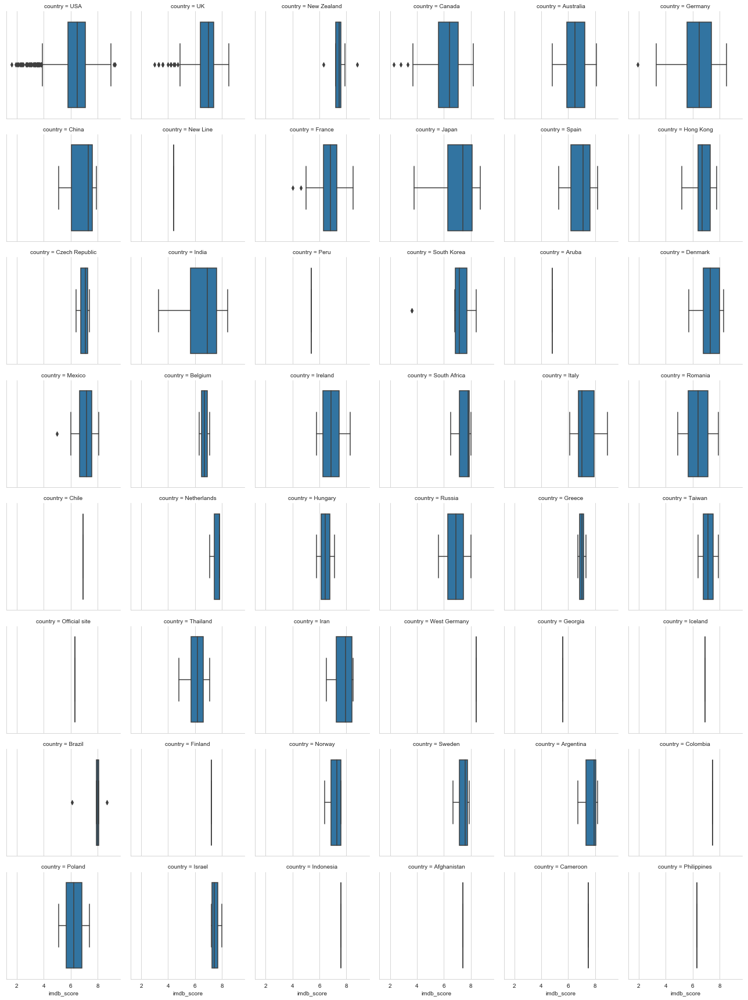

In [59]:
#Boxplot Dist. of Movie Scores by Country
g = sns.FacetGrid(df2, col="country", col_wrap=6)
g.map(sns.boxplot, "imdb_score")

In [60]:
#Avg. IMDB Score by Country
country_score = df2.groupby('country').imdb_score.agg('mean')
country_score = pd.DataFrame(country_score)
country_score.head()

,imdb_score
country,
Afghanistan,7.400000
Argentina,7.600000
Aruba,4.800000
Australia,6.480952
Belgium,6.700000


In [61]:
#Bar Graph of Avg. IMDB Scores by Country

data = [go.Bar(
            x=df2['country'],
            y=df2['imdb_score']
    )]

iplot(data, filename='basic-bar')

Hovering over each bar displays the average IMDb score for all movies produced in the respective country. Countries that have a far lower volume of production would not be good representation of the overall predicitability of a movie's success. Pulling in more international movie data, and then training a model to predict on this factor, would be the best route. <br>
<br>
It is interesting however, that the movies that <i>did</i> make it on this dataset from France resulted in a relatively low average of 4.4, compared to the average 6.4 rating.

### ii. Finding out what movie has an absurd of amount of likes relative to every other one reported

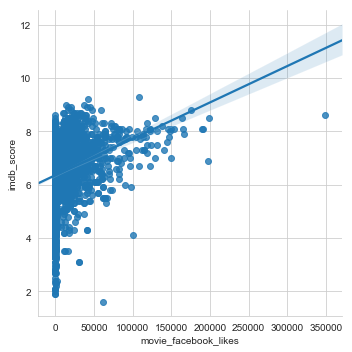

In [62]:
#Visualize it

sns.lmplot(x='movie_facebook_likes', y='imdb_score', data=df2)

In [63]:
#Finding out the index location what crazy movie has the most likes on the graph way out there:

print(df2['movie_facebook_likes'].idxmax())
print(df2['movie_facebook_likes'].max())

94
349000


In [64]:
df2.iloc[94]

color                                                                    Color
director_name                                                Christopher Nolan
num_critic_for_reviews                                                     712
duration                                                                   169
director_facebook_likes                                                  22000
actor_3_facebook_likes                                                    6000
actor_2_name                                                     Anne Hathaway
actor_1_facebook_likes                                                   11000
gross                                                              1.87991e+08
genres                                                  Adventure|Drama|Sci-Fi
actor_1_name                                               Matthew McConaughey
movie_title                                                      Interstellar 
num_voted_users                                     

## Correlation Analysis Heatmap

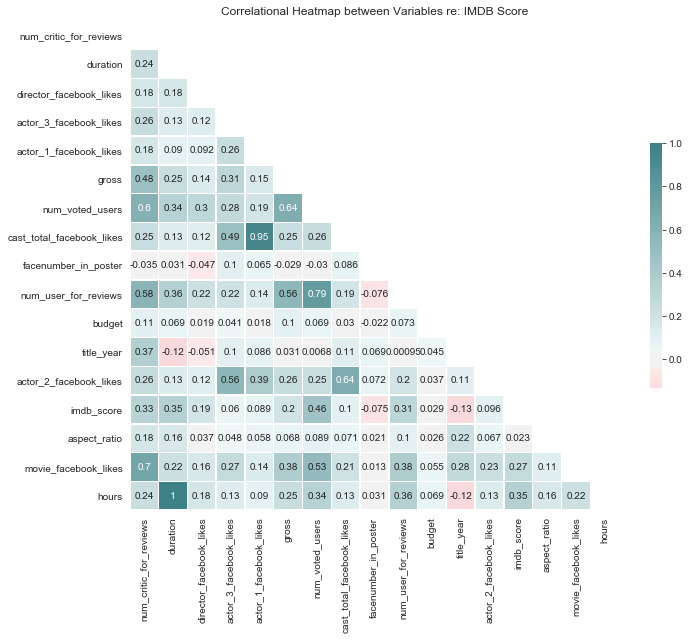

In [65]:
# Compute the correlation matrix
corr = df2.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(10, 200, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, annot=True, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5});

ax.set_title('Correlational Heatmap between Variables re: IMDB Score')
plt.show()

For improved readability, we can isolate just the correlation of variables related to IMDb Score:

In [66]:
corr = pd.DataFrame(df2.corr()['imdb_score'].drop('imdb_score'))
corr.sort_values(['imdb_score'], ascending = False)

#https://stackoverflow.com/questions/34896455/how-to-do-pearson-correlation-of-selected-columns-of-a-pandas-data-frame (Links to an external site.)Links to an external site.

,imdb_score
num_voted_users,0.456972
duration,0.351108
hours,0.351108
num_critic_for_reviews,0.334089
num_user_for_reviews,0.309157
movie_facebook_likes,0.270708
gross,0.199775
director_facebook_likes,0.185514
cast_total_facebook_likes,0.099830
actor_2_facebook_likes,0.096239


<b>From the heatmap we can infer:</b>

- Predicting IMDb Score is *most* dependent on the number of users who voted, which is interesting. The more people that vote for a movie, the more likely it is that it will do well based on just the volume of voters alone.
- Duration actually has the strongest positive correlation that isn't dependent on the volume of users/critics who voted or reviewed. The longer the movie is, the more likely it is that it will perform well.
- Gross Value, for those rows that remain after dropping all NaN values, has a weak positive correlation. This means that the larger the gross value is, the more likely it is the movie performs favorably.
- The inverse is true for both facenumber_in_poster and title_year variables. Although very weak inverse correlations, the newer the movie is and/or the more faces you have in the movie poster, the more likely it is the movie performs <b>unfavorably.</b>

# 6. EDA Storytelling

What did we find during Exploratory Data Analysis?

What did we find?

<br>
<b>General Data Insights:</b>

- The original data had a lot of inconsistencies and missing values due to the scraping process executed in Sun's ScraPy code.


- Not all missing/NaN values could be accounted for, such as Gross or Budget Values


- As a result of data preprocessing, the "cleaned" dataset is largely movies produced in the USA. This is important especially when drilling down on Country specific datapoints. We are *not* able to assume normality as a result and should not make inferences between Country and IMDb score.


- Using Quantitative Values such as 'Likes' to predict IMdb without creating a classification model may not yield an accurate results. If it were possible, doing a time series analysis on Volume of Likes may reveal more insight.


- <b>Duration was the strongest predictor outside of volume of votes/reviews/users commenting</b>


- Director's Name does also allow us to infer the likelihood of a movie's success, but due to the small sample size the feature would make a poor classification predictor


<br>
<b>Specific Data Insights:</b>
<br>

- The worst movie was Justin Bieber's "Never Say Never" with a score of 1.9
- The best movie was Shawshank Redemption with a score of 9.3
- The movie that had the greatest amount of facebook likes on it's respective movie page was Interstellar

# 7. Linear Regression and Classification Model Development

#### Cleaning non-numerical data further to be used in feature selection

In [67]:

# Movie Genre
df2['genres'] = df2['genres'].str.strip()
df2['genres'] = df2['genres'].str.replace('|', " ")
df2['genres'] = df2['genres'].str.split()

# Selecting first genre as defining value
df2['genres'] = df2['genres'].map(lambda x: x[0])

# Preview Results
df2['genres'].value_counts().head(15)

Comedy         1133
Action          985
Drama           773
Adventure       389
Crime           284
Biography       224
Horror          168
Documentary      54
Animation        50
Fantasy          40
Mystery          24
Sci-Fi            8
Thriller          6
Western           4
Musical           3
Name: genres, dtype: int64

In [68]:
# Movies that have a missing rating are replaced with the rating NR which means No Rating or Not Rated

df2['content_rating'].fillna('NR', inplace=True)

# Attempting to simplify/consolidate the various ratings
df2['content_rating'].replace({'Unrated': 'NR', 'Not Rated':'NR', 'Approved':'NR', 'Passed':'NR',
                              'GP':'G', 'M':'R', 'TV-Y7':'G','TV-Y':'G', 'X':'R', 'TV-14': 'PG-13',
                              'TV-MA': 'R', 'TV-PG':'PG', 'TV-G':'G', 'NC-17':'R'}, inplace=True)

In [69]:
df2 = pd.get_dummies(df2,columns=['content_rating','genres'],prefix=['rating','genre'])
df2.rename(columns={'rating_PG-13': 'rating_PG13'},inplace=True)
df2.rename(columns={'genre_Sci-Fi': 'genre_SciFi'},inplace=True)
df2.head()

,color,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,actor_1_name,...,genre_Family,genre_Fantasy,genre_Horror,genre_Music,genre_Musical,genre_Mystery,genre_Romance,genre_SciFi,genre_Thriller,genre_Western
0,Color,James Cameron,723.0,178.0,0.0,855.0,Joel David Moore,1000.0,760505847.0,CCH Pounder,...,0,0,0,0,0,0,0,0,0,0
1,Color,Gore Verbinski,302.0,169.0,563.0,1000.0,Orlando Bloom,40000.0,309404152.0,Johnny Depp,...,0,0,0,0,0,0,0,0,0,0
2,Color,Sam Mendes,602.0,148.0,0.0,161.0,Rory Kinnear,11000.0,200074175.0,Christoph Waltz,...,0,0,0,0,0,0,0,0,0,0
3,Color,Christopher Nolan,813.0,164.0,22000.0,23000.0,Christian Bale,27000.0,448130642.0,Tom Hardy,...,0,0,0,0,0,0,0,0,0,0
4,Color,Andrew Stanton,462.0,132.0,475.0,530.0,Samantha Morton,640.0,73058679.0,Daryl Sabara,...,0,0,0,0,0,0,0,0,0,0


In [70]:
df2['num_critic_for_reviews'].fillna(df2['num_critic_for_reviews'].mean(), inplace=True)

# Replacing NA values with zero, cannot impute with high accuracy
df2['director_facebook_likes'].fillna(0, inplace=True)
df2['actor_1_facebook_likes'].fillna(0, inplace=True)
df2['actor_2_facebook_likes'].fillna(0, inplace=True)
df2['actor_3_facebook_likes'].fillna(0, inplace=True)
df2['facenumber_in_poster'].fillna(df2['facenumber_in_poster'].mean(), inplace=True)

In [71]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4152 entries, 0 to 4151
Data columns (total 54 columns):
color                        4150 non-null object
director_name                4152 non-null object
num_critic_for_reviews       4152 non-null float64
duration                     4152 non-null float64
director_facebook_likes      4152 non-null float64
actor_3_facebook_likes       4152 non-null float64
actor_2_name                 4150 non-null object
actor_1_facebook_likes       4152 non-null float64
gross                        4152 non-null float64
actor_1_name                 4152 non-null object
movie_title                  4152 non-null object
num_voted_users              4152 non-null int64
cast_total_facebook_likes    4152 non-null int64
actor_3_name                 4143 non-null object
facenumber_in_poster         4152 non-null float64
plot_keywords                4112 non-null object
movie_imdb_link              4152 non-null object
num_user_for_reviews         4152 non-

### Dropping Columns

In [72]:
df2.dropna(inplace=True)

df2 = df2.drop(['director_name','budget', 'aspect_ratio', 'actor_2_name',
                'actor_1_name','movie_title','actor_3_name','plot_keywords','movie_imdb_link',
               'language','country'],axis=1)
    
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3786 entries, 0 to 4151
Data columns (total 43 columns):
color                        3786 non-null object
num_critic_for_reviews       3786 non-null float64
duration                     3786 non-null float64
director_facebook_likes      3786 non-null float64
actor_3_facebook_likes       3786 non-null float64
actor_1_facebook_likes       3786 non-null float64
gross                        3786 non-null float64
num_voted_users              3786 non-null int64
cast_total_facebook_likes    3786 non-null int64
facenumber_in_poster         3786 non-null float64
num_user_for_reviews         3786 non-null float64
title_year                   3786 non-null float64
actor_2_facebook_likes       3786 non-null float64
imdb_score                   3786 non-null float64
movie_facebook_likes         3786 non-null int64
dur_group                    3786 non-null category
dur_group_num                3786 non-null category
hours                        37

### Building Regression Model and Fitting

In [73]:
# Defining our x and y variables. We are dropping our non numeric variables because based on EDA and Data Mining we didnt see any
# Deleting 'Budget' as imputing the values would be highly unrepresentative. The missing values were just not reported
# Due to colinearity in FB likes-related features, removing all Actor FB likes, too


X = df2[['num_critic_for_reviews','duration','director_facebook_likes','gross','num_voted_users','cast_total_facebook_likes',
       'num_user_for_reviews','title_year','rating_R','rating_PG13','rating_PG','rating_G','genre_Action',
        'genre_Animation','genre_Biography','genre_Comedy','genre_Crime','genre_Documentary','genre_Drama','genre_Family',
        'genre_Fantasy','genre_Horror','genre_Musical','genre_Mystery','genre_Romance','genre_SciFi','genre_Thriller']]

y = df2['imdb_score']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)

In [74]:
model1 = lm.LinearRegression()
model1.fit(X_train, y_train)   
model1_y = model1.predict(X_test)

In [75]:
print('Coefficients: ', model1.coef_)
print("y-intercept ", model1.intercept_)

Coefficients:  [ 2.59016876e-03  7.77359656e-03 -1.32404289e-06 -1.28974749e-09
  3.29259920e-06 -4.04192677e-07 -4.41871620e-04 -2.46305396e-02
 -1.52910236e-01 -4.47144786e-01 -2.96223309e-01 -3.04571598e-01
 -3.51955094e-01  5.33627666e-01  4.91486181e-01 -1.26179433e-01
  1.22603218e-01  7.89358242e-01  2.58038834e-01  7.79537450e-02
 -3.78358634e-01 -7.05139249e-01 -7.41551349e-01 -2.66318899e-01
  6.01899272e-02 -1.22911583e-01 -9.36288511e-01]
y-intercept  54.73295902051724


In [76]:
pd.DataFrame(list(zip(X.columns, np.transpose(model1.coef_))))

coef = ["%.3f" % i for i in model1.coef_]
xcolumns = [ i for i in X.columns ]
pd.DataFrame(list(zip(xcolumns, coef)))

,0,1
0,num_critic_for_reviews,0.003
1,duration,0.008
2,director_facebook_likes,-0.000
3,gross,-0.000
4,num_voted_users,0.000
5,cast_total_facebook_likes,-0.000
6,num_user_for_reviews,-0.000
7,title_year,-0.025
8,rating_R,-0.153
9,rating_PG13,-0.447


### Full Regression Model (no features removed)

In [77]:
# Full Regression Model

imdb_model = ols("imdb_score~num_critic_for_reviews+duration+director_facebook_likes+\
                 gross+num_voted_users+cast_total_facebook_likes+num_user_for_reviews+title_year+\
                 rating_R+rating_PG13+rating_PG+rating_G+genre_Action+genre_Animation+genre_Biography+\
                 genre_Comedy+genre_Crime+genre_Documentary+genre_Drama+genre_Family+genre_Fantasy+\
                 genre_Horror+genre_Musical+genre_Mystery+genre_Romance+genre_SciFi+genre_Thriller",df2)
imdb_reg = imdb_model.fit()
print(imdb_reg.summary())

                            OLS Regression Results                            
Dep. Variable:             imdb_score   R-squared:                       0.442
Model:                            OLS   Adj. R-squared:                  0.438
Method:                 Least Squares   F-statistic:                     110.3
Date:                Wed, 05 Dec 2018   Prob (F-statistic):               0.00
Time:                        22:08:19   Log-Likelihood:                -4476.2
No. Observations:                3786   AIC:                             9008.
Df Residuals:                    3758   BIC:                             9183.
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept             

### Feature Selection using SelectKBest Method

K will be increased by increments of 3 to avoid negligent (and/or negative) changes in R^2 values

<b>K = 5</b>

In [78]:
X_new = SelectKBest(f_regression, k=5).fit_transform(X, y)

In [79]:
model2 = lm.LinearRegression()
model2.fit(X_new, y)
model2_y = model2.predict(X_new)

print("mean square error: ", mean_squared_error(y, model2_y))
print("variance or r-squared: ", explained_variance_score(y, model2_y))

mean square error:  0.7673347771864252
variance or r-squared:  0.3127033108965921


<b>K = 8</b>

In [80]:
X_new = SelectKBest(f_regression, k=8).fit_transform(X, y)

model3 = lm.LinearRegression()
model3.fit(X_new, y)
model3_y = model3.predict(X_new)

print("mean square error: ", mean_squared_error(y, model3_y))
print("variance or r-squared: ", explained_variance_score(y, model3_y))

mean square error:  0.7460833237746163
variance or r-squared:  0.3317380972803492


<b>K = 11</b>

In [81]:
X_new = SelectKBest(f_regression, k=11).fit_transform(X, y)

model4 = lm.LinearRegression()
model4.fit(X_new, y)
model4_y = model4.predict(X_new)

print("mean square error: ", mean_squared_error(y, model4_y))
print("variance or r-squared: ", explained_variance_score(y, model4_y))

mean square error:  0.6966854591525139
variance or r-squared:  0.375983438183621


<b>K = 13</b>

In [82]:
X_new = SelectKBest(f_regression, k=13).fit_transform(X, y)

model5 = lm.LinearRegression()
model5.fit(X_new, y)
model5_y = model5.predict(X_new)

print("mean square error: ", mean_squared_error(y, model5_y))
print("variance or r-squared: ", explained_variance_score(y, model5_y))

mean square error:  0.6543196785098281
variance or r-squared:  0.4139301879370535


<b>K = 16</b>

*This K-value is just a little over half the amount of all features in the dataset. To avoid instances of extreme overfitting we will stop here where R^2 = .43

In [83]:
X_new = SelectKBest(f_regression, k=16).fit_transform(X, y)

model6 = lm.LinearRegression()
model6.fit(X_new, y)
model6_y = model6.predict(X_new)

print("mean square error: ", mean_squared_error(y, model6_y))
print("variance or r-squared: ", explained_variance_score(y, model6_y))

mean square error:  0.6359270378798951
variance or r-squared:  0.43040435460414117


### Feature Selection using RFE method

This method scores the importance of the features and lists them specifically.

In [84]:
lr = lm.LinearRegression()
#Still using the k= 16 value to select features
rfe = RFE(lr, n_features_to_select=16)
rfe_y = rfe.fit(X,y)

print("Ranked Features:")
print(sorted(list(zip(map(lambda x: x, rfe.ranking_), X.columns))))

Ranked Features:
[(1, 'genre_Action'), (1, 'genre_Animation'), (1, 'genre_Biography'), (1, 'genre_Comedy'), (1, 'genre_Crime'), (1, 'genre_Documentary'), (1, 'genre_Drama'), (1, 'genre_Fantasy'), (1, 'genre_Horror'), (1, 'genre_Romance'), (1, 'genre_SciFi'), (1, 'genre_Thriller'), (1, 'rating_G'), (1, 'rating_PG'), (1, 'rating_PG13'), (1, 'rating_R'), (2, 'genre_Musical'), (3, 'genre_Mystery'), (4, 'duration'), (5, 'genre_Family'), (6, 'title_year'), (7, 'num_critic_for_reviews'), (8, 'num_user_for_reviews'), (9, 'num_voted_users'), (10, 'cast_total_facebook_likes'), (11, 'director_facebook_likes'), (12, 'gross')]


<b>This is not an effective feature selection method as only the split genres and movie content ratings were selected. This is likely a result of the dummy variable trap. We will not use RFE to select features from the data that I cleaned - although had it been pre-processed a different way the ranked features may differ</b>

### Neural Network Regression Model

In [85]:
from sklearn.neural_network import MLPRegressor

X = df2[['num_critic_for_reviews','duration','director_facebook_likes','gross','num_voted_users','cast_total_facebook_likes',
       'num_user_for_reviews','title_year','rating_R','rating_PG13','rating_PG','rating_G','genre_Action',
        'genre_Animation','genre_Biography','genre_Comedy','genre_Crime','genre_Documentary','genre_Drama','genre_Family',
        'genre_Fantasy','genre_Horror','genre_Musical','genre_Mystery','genre_Romance','genre_SciFi','genre_Thriller']]

y = df2['imdb_score']

X = (X-X.min())/(X.max()-X.min()) #Normalizing values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)



mlp = MLPRegressor(max_iter=10000)

mlp.fit(X_train,y_train)
y_pred = mlp.predict(X_test)

print("mean square error: ", mean_squared_error(y_test, y_pred))
print("variance or r-squared: ", explained_variance_score(y_test, y_pred))

mean square error:  0.6298604011119966
variance or r-squared:  0.44106637624057965


<b>Improving upon the SelectKBest model accuracy slightly... I would have thought there would be a greater increase in accuracy than just roughly 3%</b>

### Random Forest Regression Model

In [86]:
from sklearn.ensemble import RandomForestRegressor

#assigning columns to X and Y variables
X = df2[['num_critic_for_reviews','duration','director_facebook_likes','gross','num_voted_users','cast_total_facebook_likes',
       'num_user_for_reviews','title_year','rating_R','rating_PG13','rating_PG','rating_G','genre_Action',
        'genre_Animation','genre_Biography','genre_Comedy','genre_Crime','genre_Documentary','genre_Drama','genre_Family',
        'genre_Fantasy','genre_Horror','genre_Musical','genre_Mystery','genre_Romance','genre_SciFi','genre_Thriller']]

y = df2['imdb_score']

#Using a 20/80 split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)

#Building a random forest regressor with 200 trees
regr = RandomForestRegressor(random_state=1, n_estimators=200)
regr.fit(X_train, y_train)
regr_predicted = regr.predict(X_test)

print("mean square error: ", mean_squared_error(y_test, regr_predicted))
print("variance or r-squared: ", explained_variance_score(y_test, regr_predicted))

mean square error:  0.5309737519788917
variance or r-squared:  0.5293642885592212


<b>Overall an improvement for both MSE and R-squared. We have an increased accuracy of 53% here based on Random Forest Regression modeling. This model thus far performs the best, so we will use it to now build a classification model.</b>

# 8. Classification

In [87]:
# Logistic Regression, K Nearest Neighbors, SVM, Neural Network, and Random Forest Classifiers to test
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn import svm
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier



#Model Validation Packages
import statsmodels.api as sm
from sklearn.metrics import classification_report, f1_score, accuracy_score, confusion_matrix
from sklearn.model_selection import StratifiedKFold, cross_val_score, train_test_split, GridSearchCV 
from sklearn import metrics
from sklearn.metrics import roc_curve, auc #Will help determining AUC, ROC for validation

In [88]:
df2['quality'] = 0
df2.head()

,color,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_1_facebook_likes,gross,num_voted_users,cast_total_facebook_likes,facenumber_in_poster,...,genre_Fantasy,genre_Horror,genre_Music,genre_Musical,genre_Mystery,genre_Romance,genre_SciFi,genre_Thriller,genre_Western,quality
0,Color,723.0,178.0,0.0,855.0,1000.0,760505847.0,886204,4834,0.0,...,0,0,0,0,0,0,0,0,0,0
1,Color,302.0,169.0,563.0,1000.0,40000.0,309404152.0,471220,48350,0.0,...,0,0,0,0,0,0,0,0,0,0
2,Color,602.0,148.0,0.0,161.0,11000.0,200074175.0,275868,11700,1.0,...,0,0,0,0,0,0,0,0,0,0
3,Color,813.0,164.0,22000.0,23000.0,27000.0,448130642.0,1144337,106759,0.0,...,0,0,0,0,0,0,0,0,0,0
4,Color,462.0,132.0,475.0,530.0,640.0,73058679.0,212204,1873,1.0,...,0,0,0,0,0,0,0,0,0,0


### Grouping/'Binning' Movies by IMDB Score Categories

In [89]:
for index, row in df2.iterrows():
    if df2['imdb_score'][index] < 4:
        df2['quality'][index] = 0
    elif df2['imdb_score'][index] >=4 and df2['imdb_score'][index] <6:
        df2['quality'][index] = 1
    elif df2['imdb_score'][index] >=6 and df2['imdb_score'][index] <8:
        df2['quality'][index] = 2
    else:
        df2['quality'][index] = 3

In [90]:
df2['quality'].unique()

array([2, 3, 1, 0], dtype=int64)

<b>Visualing Distribution of Movies by IMDB Score Category</b>

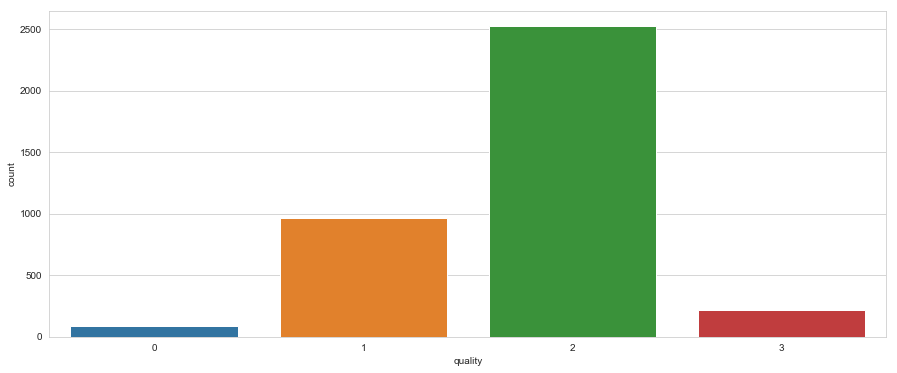

In [91]:
plt.figure(figsize=(15,6))
sns.countplot(x=df2['quality'])

### Classification Model #1: Logistic Regression

In [92]:
X = df2[['num_critic_for_reviews','duration','director_facebook_likes','gross','num_voted_users','cast_total_facebook_likes',
       'num_user_for_reviews','title_year','rating_R','rating_PG13','rating_PG','rating_G','genre_Action',
        'genre_Animation','genre_Biography','genre_Comedy','genre_Crime','genre_Documentary','genre_Drama','genre_Family',
        'genre_Fantasy','genre_Horror','genre_Musical','genre_Mystery','genre_Romance','genre_SciFi','genre_Thriller']]

y = df2['quality']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)

#Standardizing the Model
X = (X-X.mean()) / (X.std())
X.head()

,num_critic_for_reviews,duration,director_facebook_likes,gross,num_voted_users,cast_total_facebook_likes,num_user_for_reviews,title_year,rating_R,rating_PG13,...,genre_Documentary,genre_Drama,genre_Family,genre_Fantasy,genre_Horror,genre_Musical,genre_Mystery,genre_Romance,genre_SciFi,genre_Thriller
0,4.497331,2.979459,-0.262257,10.074915,5.141356,-0.347343,6.620884,0.608524,-0.911337,1.373817,...,-0.086306,-0.465321,-0.028157,-0.099331,-0.213437,-0.022987,-0.07817,-0.016252,-0.04601,-0.016252
1,1.093702,2.583549,-0.078071,3.657110,2.409234,1.934385,2.198262,0.405879,-0.911337,1.373817,...,-0.086306,-0.465321,-0.028157,-0.099331,-0.213437,-0.022987,-0.07817,-0.016252,-0.04601,-0.016252
2,3.519091,1.659758,-0.262257,2.101677,1.123099,0.012671,1.604033,1.216459,-0.911337,1.373817,...,-0.086306,-0.465321,-0.028157,-0.099331,-0.213437,-0.022987,-0.07817,-0.016252,-0.04601,-0.016252
3,5.224948,2.363599,6.935079,5.630766,6.840821,4.997017,5.761200,0.912491,-0.911337,1.373817,...,-0.086306,-0.465321,-0.028157,-0.099331,-0.213437,-0.022987,-0.07817,-0.016252,-0.04601,-0.016252
4,2.387243,0.955918,-0.106860,0.294633,0.703955,-0.502600,0.980580,0.912491,-0.911337,1.373817,...,-0.086306,-0.465321,-0.028157,-0.099331,-0.213437,-0.022987,-0.07817,-0.016252,-0.04601,-0.016252


In [93]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)

In [94]:
lr = LogisticRegression()
lr.fit(X_train,y_train)

#Model evaluation
# http://scikit-learn.org/stable/modules/model_evaluation.html
print(metrics.accuracy_score(y_test, lr.predict(X_test)))
print("--------------------------------------------------------")
print(metrics.confusion_matrix(y_test, lr.predict(X_test))) 
print("--------------------------------------------------------")
print(metrics.classification_report(y_test, lr.predict(X_test)))
print("--------------------------------------------------------")

# The method to determine roc and auc will not work as it only accepts binary classification
# print(metrics.roc_auc_score(y_test, lr.predict(X_test)))

0.7519788918205804
--------------------------------------------------------
[[  0  10  10   0]
 [  0  58 122   0]
 [  1  24 488   0]
 [  0   0  21  24]]
--------------------------------------------------------
             precision    recall  f1-score   support

          0       0.00      0.00      0.00        20
          1       0.63      0.32      0.43       180
          2       0.76      0.95      0.85       513
          3       1.00      0.53      0.70        45

avg / total       0.72      0.75      0.71       758

--------------------------------------------------------


<b>Model Validation: 10-Fold Cross Validation</b>

In [95]:
scores = cross_val_score(lr, X_test, y_test, scoring='accuracy', cv=10)
print(scores, scores.mean())

[0.64935065 0.75324675 0.79220779 0.77631579 0.71052632 0.69333333
 0.74666667 0.70666667 0.76       0.74666667] 0.7334980633401685


<b>Logistic Regression Classification Average Accuracy: 73%</b>

### Classification Model #2: KNN

In [96]:
X = df2[['num_critic_for_reviews','duration','director_facebook_likes','gross','num_voted_users','cast_total_facebook_likes',
       'num_user_for_reviews','title_year','rating_R','rating_PG13','rating_PG','rating_G','genre_Action',
        'genre_Animation','genre_Biography','genre_Comedy','genre_Crime','genre_Documentary','genre_Drama','genre_Family',
        'genre_Fantasy','genre_Horror','genre_Musical','genre_Mystery','genre_Romance','genre_SciFi','genre_Thriller']]

y = df2['quality']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)

#Standardizing the Model
X = (X-X.mean()) / (X.std())
X.head()

# Training and Fitting the model
knn = KNeighborsClassifier(n_neighbors=15)
knn = knn.fit(X_train, y_train)

#Model evaluation
# http://scikit-learn.org/stable/modules/model_evaluation.html
print(metrics.accuracy_score(y_test, knn.predict(X_test)))
print("--------------------------------------------------------")
print(metrics.confusion_matrix(y_test, knn.predict(X_test))) 
print("--------------------------------------------------------")
print(metrics.classification_report(y_test, knn.predict(X_test)))
print("--------------------------------------------------------")

# The method to determine roc and auc will not work as it only accepts binary classification
# print(metrics.roc_auc_score(y_test, knn.predict(X_test)))

0.6530343007915568
--------------------------------------------------------
[[  0   3  17   0]
 [  0  27 152   1]
 [  0  45 468   0]
 [  0   3  42   0]]
--------------------------------------------------------
             precision    recall  f1-score   support

          0       0.00      0.00      0.00        20
          1       0.35      0.15      0.21       180
          2       0.69      0.91      0.79       513
          3       0.00      0.00      0.00        45

avg / total       0.55      0.65      0.58       758

--------------------------------------------------------


C:\Users\Mike Gagliano\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.



In [97]:
scores = cross_val_score(knn, X_test, y_test, scoring='accuracy', cv=10)
print(scores, scores.mean())

[0.61038961 0.63636364 0.66233766 0.63157895 0.68421053 0.6
 0.65333333 0.66666667 0.69333333 0.66666667] 0.6504880382775119


<b>KNN Classification Average Accuracy: 65%</b>

### Classification Model #3: SVC (linear)

In [98]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)

#Standardizing the Model
X = (X-X.mean()) / (X.std())
X.head()

# Training and Fitting the model
svc = svm.SVC(kernel='linear')
svc.fit(X_train,y_train)

#Model evaluation
# http://scikit-learn.org/stable/modules/model_evaluation.html
print(metrics.accuracy_score(y_test, svc.predict(X_test)))
print("--------------------------------------------------------")
print(metrics.confusion_matrix(y_test, svc.predict(X_test))) 
print("--------------------------------------------------------")
print(metrics.classification_report(y_test, svc.predict(X_test)))
print("--------------------------------------------------------")

# The method to determine roc and auc will not work as it only accepts binary classification
# print(metrics.roc_auc_score(y_test, svc.predict(X_test)))

0.7598944591029023
--------------------------------------------------------
[[  0  13   7   0]
 [  0  89  91   0]
 [  0  47 462   4]
 [  0   0  20  25]]
--------------------------------------------------------
             precision    recall  f1-score   support

          0       0.00      0.00      0.00        20
          1       0.60      0.49      0.54       180
          2       0.80      0.90      0.85       513
          3       0.86      0.56      0.68        45

avg / total       0.73      0.76      0.74       758

--------------------------------------------------------


C:\Users\Mike Gagliano\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.



In [99]:
scores = cross_val_score(svc, X_test, y_test, scoring='accuracy', cv=10)
print(scores, scores.mean())

[0.71428571 0.7012987  0.77922078 0.82894737 0.68421053 0.74666667
 0.70666667 0.73333333 0.78666667 0.69333333] 0.7374629756208704


<b>Linear SVC Classification Average Accuracy: 74%</b>

### Classification Model #4: SVC (polynomial)

In [100]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)

#Standardizing the Model
X = (X-X.mean()) / (X.std())
X.head()

# Training and Fitting the model
svc = svm.SVC(kernel='poly')
svc.fit(X_train,y_train)

#Model evaluation
# http://scikit-learn.org/stable/modules/model_evaluation.html
print(metrics.accuracy_score(y_test, svc.predict(X_test)))
print("--------------------------------------------------------")
print(metrics.confusion_matrix(y_test, svc.predict(X_test))) 
print("--------------------------------------------------------")
print(metrics.classification_report(y_test, svc.predict(X_test)))
print("--------------------------------------------------------")

# The method to determine roc and auc will not work as it only accepts binary classification
# print(metrics.roc_auc_score(y_test, svc.predict(X_test)))

0.7150395778364116
--------------------------------------------------------
[[  0   2  18   0]
 [  0  22 157   1]
 [  0   9 497   7]
 [  0   0  22  23]]
--------------------------------------------------------
             precision    recall  f1-score   support

          0       0.00      0.00      0.00        20
          1       0.67      0.12      0.21       180
          2       0.72      0.97      0.82       513
          3       0.74      0.51      0.61        45

avg / total       0.69      0.72      0.64       758

--------------------------------------------------------


C:\Users\Mike Gagliano\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.



In [101]:
scores = cross_val_score(svc, X_test, y_test, scoring='accuracy', cv=10)
print(scores, scores.mean())

[0.66233766 0.67532468 0.7012987  0.68421053 0.68421053 0.65333333
 0.70666667 0.65333333 0.70666667 0.72      ] 0.6847382091592618


<b>Linear SVC Classification Average Accuracy: 68%</b>

### Classification Model #5: Random Forest

In [102]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)

#Standardizing the Model
X = (X-X.mean()) / (X.std())
X.head()

# Training and Fitting the model
rf = RandomForestClassifier(n_estimators=30)    #building 30 decision trees
rf =rf.fit(X_train, y_train)
rf.score(X_test, y_test)

#Model evaluation
# http://scikit-learn.org/stable/modules/model_evaluation.html
print(metrics.accuracy_score(y_test, rf.predict(X_test)))
print("--------------------------------------------------------")
print(metrics.confusion_matrix(y_test, rf.predict(X_test))) 
print("--------------------------------------------------------")
print(metrics.classification_report(y_test, rf.predict(X_test)))
print("--------------------------------------------------------")

# The method to determine roc and auc will not work as it only accepts binary classification
# print(metrics.roc_auc_score(y_test, rf.predict(X_test)))

0.7651715039577837
--------------------------------------------------------
[[  2  13   5   0]
 [  0  88  92   0]
 [  0  38 472   3]
 [  0   0  27  18]]
--------------------------------------------------------
             precision    recall  f1-score   support

          0       1.00      0.10      0.18        20
          1       0.63      0.49      0.55       180
          2       0.79      0.92      0.85       513
          3       0.86      0.40      0.55        45

avg / total       0.76      0.77      0.74       758

--------------------------------------------------------


In [103]:
scores = cross_val_score(rf, X_test, y_test, scoring='accuracy', cv=10)
print(scores, scores.mean())

[0.7012987  0.79220779 0.77922078 0.73684211 0.60526316 0.70666667
 0.78666667 0.78666667 0.74666667 0.74666667] 0.73881658692185


<b>Random Forest Classification Average Accuracy: 74%</b>

### Classification Model #6: Neural Network 

In [104]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)

#Standardizing the Model
X = (X-X.mean()) / (X.std())
X.head()

# Training and Fitting the model
mlp = MLPClassifier(max_iter=10000)
mlp.fit(X_train,y_train)

#Model evaluation
# http://scikit-learn.org/stable/modules/model_evaluation.html
print(metrics.accuracy_score(y_test, mlp.predict(X_test)))
print("--------------------------------------------------------")
print(metrics.confusion_matrix(y_test, mlp.predict(X_test))) 
print("--------------------------------------------------------")
print(metrics.classification_report(y_test, mlp.predict(X_test)))
print("--------------------------------------------------------")

# The method to determine roc and auc will not work as it only accepts binary classification
# print(metrics.roc_auc_score(y_test, mlp.predict(X_test)))

0.7664907651715039
--------------------------------------------------------
[[  0  15   5   0]
 [  2  91  87   0]
 [  0  45 460   8]
 [  0   0  15  30]]
--------------------------------------------------------
             precision    recall  f1-score   support

          0       0.00      0.00      0.00        20
          1       0.60      0.51      0.55       180
          2       0.81      0.90      0.85       513
          3       0.79      0.67      0.72        45

avg / total       0.74      0.77      0.75       758

--------------------------------------------------------


In [105]:
scores = cross_val_score(mlp, X_test, y_test, scoring='accuracy', cv=10)
print(scores, scores.mean())

[0.63636364 0.67532468 0.75324675 0.81578947 0.71052632 0.72
 0.8        0.62666667 0.77333333 0.69333333] 0.7204584187742082


<b>Neural Net Classification Average Accuracy: 72%</b>

#### All models were evaluated using 10-fold cross-validation. The most accurate model <i>on average</i> was Random Forest Classification at 74%, where surprisingly linear SVC was almost the same.

# 9. Clustering (K-Means and Agglomerative)

In [106]:
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import ward_tree
from scipy.cluster.hierarchy import dendrogram, linkage, ward

from sklearn.metrics import pairwise_distances

In [107]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3786 entries, 0 to 4151
Data columns (total 44 columns):
color                        3786 non-null object
num_critic_for_reviews       3786 non-null float64
duration                     3786 non-null float64
director_facebook_likes      3786 non-null float64
actor_3_facebook_likes       3786 non-null float64
actor_1_facebook_likes       3786 non-null float64
gross                        3786 non-null float64
num_voted_users              3786 non-null int64
cast_total_facebook_likes    3786 non-null int64
facenumber_in_poster         3786 non-null float64
num_user_for_reviews         3786 non-null float64
title_year                   3786 non-null float64
actor_2_facebook_likes       3786 non-null float64
imdb_score                   3786 non-null float64
movie_facebook_likes         3786 non-null int64
dur_group                    3786 non-null category
dur_group_num                3786 non-null category
hours                        37

### NOTE: Something really broke here as a result of the categorical dtype columns. I worked to convert them, and then dropped those that contained unsalvagable NaN values. Without doing so, my Clustering functions would not run

In [108]:
df2['dur_group'] = pd.to_numeric(df2['dur_group'], errors='coerce')
df2['dur_group_num'] = pd.to_numeric(df2['dur_group_num'], errors='coerce')
df2['movie_fb_group'] = pd.to_numeric(df2['movie_fb_group'], errors='coerce')


In [109]:
df2 = df2.drop(columns=['color', 'hours_group', 'dur_group', 'genre_Music'])

<b>Normalizing the data after creating a copy of it</b>

In [110]:
df_norm = df2.copy()

# Normalizing data 

df_norm = ((df_norm-df_norm.min())/(df_norm.max()-df_norm.min()))

In [111]:
df_norm.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3786 entries, 0 to 4151
Data columns (total 40 columns):
num_critic_for_reviews       3786 non-null float64
duration                     3786 non-null float64
director_facebook_likes      3786 non-null float64
actor_3_facebook_likes       3786 non-null float64
actor_1_facebook_likes       3786 non-null float64
gross                        3786 non-null float64
num_voted_users              3786 non-null float64
cast_total_facebook_likes    3786 non-null float64
facenumber_in_poster         3786 non-null float64
num_user_for_reviews         3786 non-null float64
title_year                   3786 non-null float64
actor_2_facebook_likes       3786 non-null float64
imdb_score                   3786 non-null float64
movie_facebook_likes         3786 non-null float64
dur_group_num                3786 non-null float64
hours                        3786 non-null float64
movie_fb_group               3786 non-null float64
rating_G                  

In [112]:
# clustering analysis using k-means
k_means = KMeans(init='k-means++', n_clusters=4, random_state=0)
k_means.fit(df_norm)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=4, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=0, tol=0.0001, verbose=0)

In [113]:
#Find out cluster centers

k_means.cluster_centers_

array([[ 2.27480245e-01,  2.56909896e-01,  3.61208172e-02,
         4.44682121e-02,  1.39709859e-02,  9.09265644e-02,
         7.09273369e-02,  2.06677740e-02,  3.64558853e-02,
         7.71568954e-02,  8.81443962e-01,  1.74372268e-02,
         6.06813476e-01,  3.47513523e-02,  5.48817696e-01,
         2.56909896e-01,  4.16857361e-01, -7.77156117e-16,
        -7.28583860e-17, -3.33066907e-15,  1.00000000e+00,
         2.99760217e-15,  3.36384439e-01,  5.49199085e-02,
         2.28832952e-03,  5.56826850e-02,  2.92143402e-01,
         2.28832952e-02,  3.81388253e-03,  1.91456903e-01,
         1.62630326e-17,  8.39054157e-03,  2.28832952e-02,
         7.62776506e-04,  6.10221205e-03,  7.62776506e-04,
         1.52555301e-03,  6.07153217e-18,  1.21430643e-17,
         5.53267226e-01],
       [ 1.58820813e-01,  2.20513367e-01,  2.10743659e-02,
         2.43004529e-02,  8.35601563e-03,  3.50723514e-02,
         4.03222892e-02,  1.24763379e-02,  4.46705426e-02,
         3.96768691e-02,  8.51

### Appending Data with Cluster Groups

In [114]:
# Making a dataframe out of the clusters
df3 = pd.DataFrame(k_means.labels_, columns = ['cluster'])
# Joining df's
df4 = df_norm.join(df3)
# Cluster Distribution
df4.groupby(['cluster']).mean() 

,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_1_facebook_likes,gross,num_voted_users,cast_total_facebook_likes,facenumber_in_poster,num_user_for_reviews,...,genre_Family,genre_Fantasy,genre_Horror,genre_Musical,genre_Mystery,genre_Romance,genre_SciFi,genre_Thriller,genre_Western,quality
cluster,,,,,,,,,,,,,,,,,,,,,
0.0,0.232770,0.259963,0.039483,0.039352,0.013397,0.091220,0.076492,0.019746,0.032445,0.077280,...,0.000801,0.008013,0.035256,0.000000,0.007212,0.000801,0.002404,0.0,0.000000,0.582799
1.0,0.177781,0.243213,0.030761,0.022927,0.009987,0.042951,0.047591,0.013900,0.034830,0.050896,...,0.000000,0.006881,0.064220,0.000000,0.002294,0.000000,0.000000,0.0,0.000000,0.591743
2.0,0.188246,0.248057,0.033901,0.031713,0.011837,0.058192,0.055950,0.016958,0.031753,0.058554,...,0.001672,0.014214,0.044314,0.000836,0.004181,0.000000,0.000836,0.0,0.000836,0.581661
3.0,0.219377,0.255564,0.039965,0.040194,0.013248,0.083998,0.070409,0.019882,0.032759,0.075638,...,0.000000,0.004666,0.032659,0.000000,0.010886,0.000000,0.003110,0.0,0.000000,0.577501


Text(0.5,1,'Selecting k with the Elbow Method')

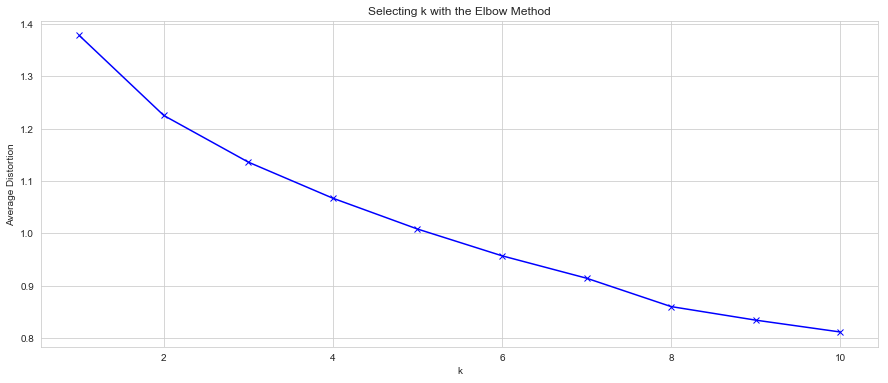

In [116]:
from scipy.spatial.distance import cdist 

# Selecting the range of K-values to iterate over and choose the best one
K = range(1,11) 

meandistortions = []

for k in K: 
    kmeans = KMeans(n_clusters=k, random_state=1) 
    kmeans.fit(df_norm) 
    meandistortions.append(sum(np.min(cdist(df_norm, kmeans.cluster_centers_, 'euclidean'), axis=1)) / df_norm.shape[0]) 

plt.figure(figsize=(15,6))    
plt.plot(K, meandistortions, 'bx-') 
plt.xlabel('k') 
plt.ylabel('Average Distortion') 
plt.title('Selecting k with the Elbow Method') 

<b>The optimal K value is relatively hard to discern here, but I would say wither 2 or 3</b>

### Agglomerative/Hierarchical Cluster Modeling

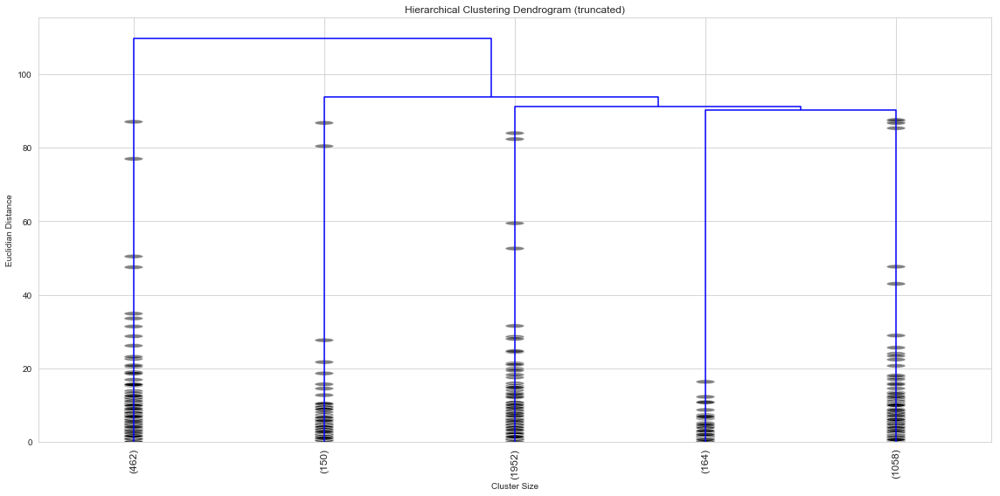

In [120]:
np.random.seed(1) # setting random seed to get the same results each time.

agg= AgglomerativeClustering(n_clusters=3, linkage='ward').fit(X)
agg.labels_

plt.figure(figsize=(16,8))

plt.title('Hierarchical Clustering Dendrogram (truncated)')
plt.xlabel('Cluster Size')
plt.ylabel('Euclidian Distance')


linkage_matrix = ward(X)
dendrogram(linkage_matrix, 
           truncate_mode='lastp',  # show only the last p merged clusters
           p=5,  # show only the last p merged clusters
           #show_leaf_counts=False,  # otherwise numbers in brackets are counts
           leaf_rotation=90.,
           leaf_font_size=12.,
           show_contracted=True,  # to get a distribution impression in truncated branches
           orientation="top")
plt.tight_layout() # fixes margins

# 10. Storytelling Summary

## EDA

- The strongest correlated features to predicting a movie's success were duration, director name, lead actor (actor 1) name, and the number of people that voted, reviewed, and/or liked a movie.


- The dataset had a tremendous amount of missing values that were either too difficult to impute with a high degree of accuracy, or needed to be thrown out due to incompleteness. Data cleaning helped reduce this, but bias in how the data was cleaned may effect the overall model efficacy.


- Factors that did not have a strong correlation to a movie's success were: genre, content rating, budget, language, and production country


## Regression

- Multiple models were used for predicitive capabilities regarding IMDb scores. These included Linear Regression, SelectKBest (feature ranking) Regression, RFE (more feature ranking), Random Forest, and Neural Net Regression.


- RFE seems as if it would be highly biased, potentially due to data leakage, but it determined the most important features were content ratings G, PG13, and R (3) - as well as all movie genres except Family, Mystery, and Musical (13).


- Random Forest was the best regression model based on its overall high accuracy; MSE and R-squared were both 0.53, as opposed to plain Linear Regression where R-squared was only 0.44.


## Classification

- The classification models tested were Logistic Regression, KNN, SVM (linear), SVM (polynomial), Random Forest, and Neural Net


- All models' efficacy were evaluated using 10-fold cross-validation


- Of all the models, Random Forest performed the best with an accuracy of 74% on average. SVM (linear) was nearly identical, which was surprising. No model dipped below 62% accuracy.


## Clustering

- The optimal k-value determined using the elbow method was 2 or 3, depending on preference. I had a difficult time producing clustering models as a result of categorical type data needing to be converted, and then NaN value accounted for yet-again.


- The most definitive characteristic (or greatest differences belonging to each cluster) appeared to be dependent on amount grossed. I suspect this is actually inaccurate - a decent amount of movies did not have a grossed value reported and imputing the data may have low accuracy.


- Movie Quality does not seem to have a major influence on clustering


- Overall, I believe the 2 (or 3) clusters would be most categorized by their gross amount, their number of overall reviews, the number of likes received <b>in this model</b>, but do not believe they are the best or most accurate measures had we been provided with more current and complete data.